In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('microeconomic.csv')

In [3]:
columns_to_keep = ['Title', 'Publication Year', 'Publication Type', 'Source Title', 'Abstract',
                   'Fields of Study', 'Citing Patents Count', 'Citing Works Count']
df = df[columns_to_keep]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 954 entries, 0 to 953
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Title                 954 non-null    object 
 1   Publication Year      953 non-null    float64
 2   Publication Type      954 non-null    object 
 3   Source Title          954 non-null    object 
 4   Abstract              878 non-null    object 
 5   Fields of Study       873 non-null    object 
 6   Citing Patents Count  954 non-null    int64  
 7   Citing Works Count    954 non-null    int64  
dtypes: float64(1), int64(2), object(5)
memory usage: 59.8+ KB


In [4]:
df = df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 828 entries, 2 to 950
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Title                 828 non-null    object 
 1   Publication Year      828 non-null    float64
 2   Publication Type      828 non-null    object 
 3   Source Title          828 non-null    object 
 4   Abstract              828 non-null    object 
 5   Fields of Study       828 non-null    object 
 6   Citing Patents Count  828 non-null    int64  
 7   Citing Works Count    828 non-null    int64  
dtypes: float64(1), int64(2), object(5)
memory usage: 58.2+ KB


In [5]:
#df = df[df["Citing Patents Count"] == 0]

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 828 entries, 2 to 950
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Title                 828 non-null    object 
 1   Publication Year      828 non-null    float64
 2   Publication Type      828 non-null    object 
 3   Source Title          828 non-null    object 
 4   Abstract              828 non-null    object 
 5   Fields of Study       828 non-null    object 
 6   Citing Patents Count  828 non-null    int64  
 7   Citing Works Count    828 non-null    int64  
dtypes: float64(1), int64(2), object(5)
memory usage: 58.2+ KB


In [7]:
df["Publication Year"] = df["Publication Year"].values.astype(int)
# Introducing temporal ordering
#df["Publication Year"] = pd.to_datetime(df["Publication Year"])
df = df.sort_values(by="Publication Year")

In [8]:
df = df.drop(df[(df['Abstract'] == 'n/') | (df['Abstract'] == "")].index)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 828 entries, 28 to 264
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Title                 828 non-null    object
 1   Publication Year      828 non-null    int32 
 2   Publication Type      828 non-null    object
 3   Source Title          828 non-null    object
 4   Abstract              828 non-null    object
 5   Fields of Study       828 non-null    object
 6   Citing Patents Count  828 non-null    int64 
 7   Citing Works Count    828 non-null    int64 
dtypes: int32(1), int64(2), object(5)
memory usage: 95.0+ KB


In [10]:
pd.set_option('display.max_rows', df.shape[0]+1)
pd.set_option('display.max_columns',df.shape[1]+1)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)

<AxesSubplot:xlabel='Publication Year'>

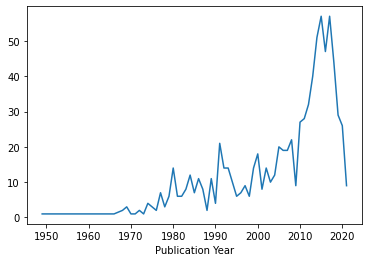

In [11]:
df.groupby('Publication Year').count()['Title'].plot()

<AxesSubplot:xlabel='Publication Year'>

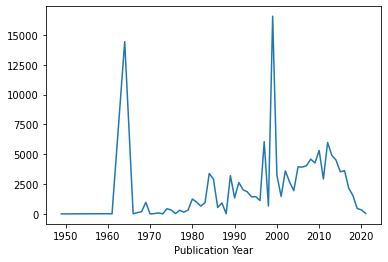

In [12]:
df.groupby('Publication Year').sum()['Citing Works Count'].plot()

In [13]:
import heapq
import re # regular expressions
import nltk
import string
nltk.download('punkt')
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\carus\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\carus\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [14]:
def preprocess(text):
    formatted_text = text.lower()
    tokens = []
    for token in nltk.word_tokenize(formatted_text):
        tokens.append(token)
    
    #print(tokens)
    tokens = [word for word in tokens if word not in stopwords and word not in string.punctuation]
    formatted_text = ' '.join(element for element in tokens)
    return formatted_text

In [15]:
df["Abstract"] = df["Abstract"].apply(preprocess)

In [16]:
counts = df.groupby('Publication Year').count()['Title'].values
place_holder = [None]*(len(counts)+1)
place_holder[0] = 0
for i in range(1,len(counts)+1):
    place_holder[i] = place_holder[i-1] + counts[i-1]

In [17]:
len(counts)

59

In [18]:
len(df['Publication Year'].unique())

59

In [19]:
df = df.drop(df[(df['Abstract'] == 'n/') | (df['Abstract'] == "")].index)

In [20]:
df[(df['Abstract'] == 'n/') | (df['Abstract'] == "")].index

Int64Index([], dtype='int64')

In [21]:
df['Publication Year'].unique()

array([1949, 1960, 1961, 1964, 1966, 1968, 1969, 1970, 1971, 1972, 1973,
       1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984,
       1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995,
       1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006,
       2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017,
       2018, 2019, 2020, 2021])

In [22]:
df['Publication Year'].value_counts() 

2017    57
2015    57
2014    51
2016    47
2018    44
2013    40
2012    32
2019    29
2011    28
2010    27
2020    26
2008    22
1991    21
2005    20
2006    19
2007    19
2000    18
2002    14
1999    14
1992    14
1993    14
1980    14
1984    12
2004    12
1986    11
1989    11
2003    10
1994    10
2021     9
1997     9
2009     9
1987     8
2001     8
1983     8
1977     7
1996     7
1985     7
1981     6
1979     6
1995     6
1982     6
1998     6
1990     4
1974     4
1978     3
1969     3
1975     3
1968     2
1972     2
1976     2
1988     2
1973     1
1971     1
1970     1
1966     1
1964     1
1961     1
1960     1
1949     1
Name: Publication Year, dtype: int64

In [23]:
interesting_years = [1968, 1969, 1972, 1974,
       1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985,
       1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996,
       1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007,
       2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018,
       2019, 2020, 2021]
interesting_years.sort()

In [50]:
recent_years = [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
               2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]
df_recent = df[df['Publication Year'].isin(recent_years)]

In [52]:
percentage_high = 0.95
percentage_low = 0.015 # 1% or 1.5% is probably better

In [53]:
# Applying TFIDF to titles
#You can still get n-grams here
vectorizer_abstracts = TfidfVectorizer(ngram_range = (2, 2), max_df = percentage_high, min_df = percentage_low)
abstracts_tfidf = vectorizer_abstracts.fit_transform(df_recent["Abstract"])
scores = (abstracts_tfidf.toarray())
#print("\n\nScores : \n", scores)

In [54]:
tf_idf_abstracts = pd.DataFrame(data=abstracts_tfidf.toarray(),columns=vectorizer_abstracts.get_feature_names())
tf_idf_abstracts.shape

(589, 46)

In [57]:
tf_idf_abstracts.columns

Index(['abstract paper', 'across countries', 'adjustment costs', 'also find', 'also show', 'business cycle', 'cross sectional', 'data set', 'decision making', 'economic growth', 'economic theory', 'empirical evidence', 'equilibrium model', 'et al', 'ex post', 'find strong', 'firm level', 'general equilibrium', 'human capital', 'labor market', 'labor supply', 'labour market', 'level data', 'life cycle', 'long run', 'long term', 'micro level', 'microeconomic data', 'microeconomic evidence', 'monetary policy', 'open economy', 'panel data', 'paper analyzes', 'paper develops', 'paper examines', 'paper investigates', 'paper studies', 'per capita', 'percentage points', 'private information', 'recent years', 'results show', 'results suggest', 'short run', 'united states', 'using data'], dtype='object')



Most relevant bi-grams 
                          term       rank
17        international trade  21.138622
19               labor supply  19.050380
0              abstract paper  17.705136
44              united states  15.196252
8          empirical evidence  14.245678
45                 using data  13.891065
10                      et al  13.836309
16             interest rates  13.696979
42                  short run  13.650644
29        microeconomic model  13.638648
36         paper investigates  13.538143
31            monetary policy  13.089225
24                  long term  12.964955
11              exchange rate  12.340397
5        developing countries  12.034840
9           equilibrium model  11.035940
13        general equilibrium  10.923457
25         microeconomic data   9.890308
7             economic theory   9.860057
20              labour market   9.837175
12                 firm level   9.492385
22                 life cycle   9.340861
35             paper examines 

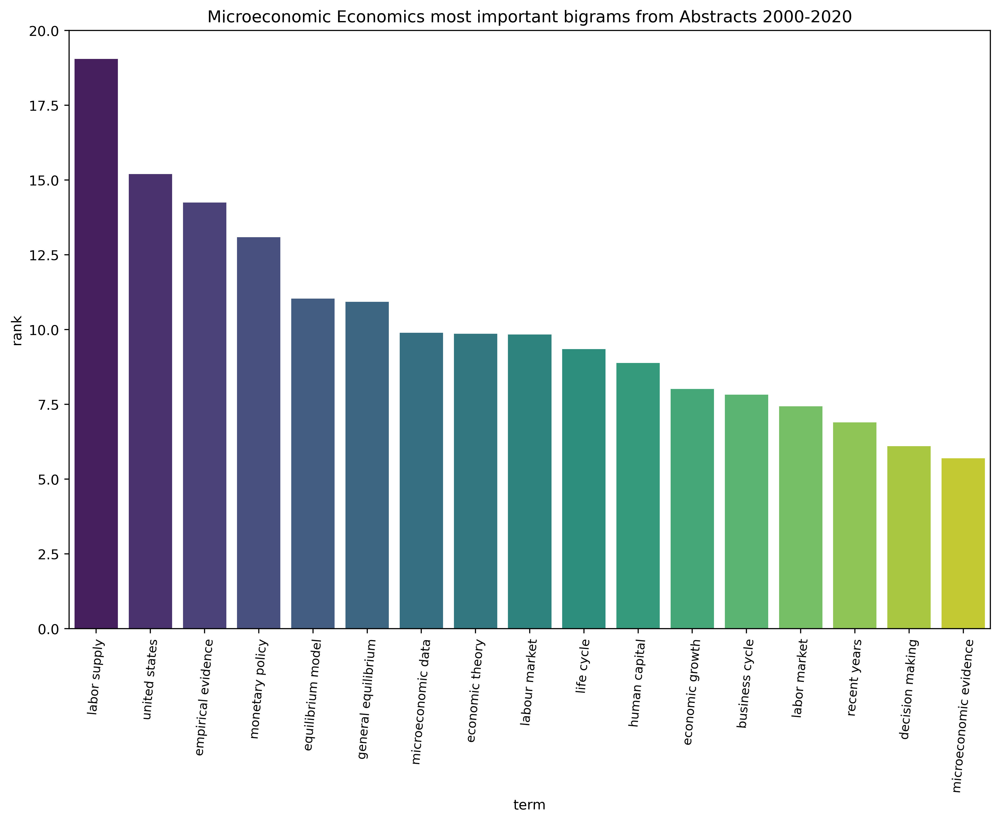

In [56]:
 # Getting top ranking features
sums = abstracts_tfidf.sum(axis = 0)
data1 = []
for col, term in enumerate(features_abstracts):
    data1.append((term, sums[0, col]))
ranking = pd.DataFrame(data1, columns = ['term', 'rank'])
words = (ranking.sort_values('rank', ascending = False))
print("\n\nMost relevant bi-grams \n", words.head(50))
plt.figure(figsize=(12,8), dpi=400)
sns.barplot(x="term", y="rank", data=ranking.loc[ranking['term'].isin(['adjustment costs', 'business cycle', 
'decision making', 'economic growth', 'economic theory', 'empirical evidence', 'equilibrium model',
'general equilibrium', 'human capital', 'labor market','labor supply', 'labour market','life cycle', 'micro level',
'microeconomic data', 'microeconomic evidence', 'monetary policy', 'open economy','private information', 'recent years', 
'united states'])].sort_values('rank', ascending = False), palette = 'viridis')
plt.title("Microeconomic Economics most important bigrams from Abstracts 2000-2020")
plt.xticks(fontsize=9, rotation=85);
plt.yticks(fontsize=10);

In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import scipy.sparse as sparse
import networkx as nx

In [25]:
percentage_high = 0.95
percentage_low = 0.015 # 1% or 1.5% is probably better

In [26]:
# Getting bigrams from abstracts
vectorizer_abstracts = CountVectorizer(ngram_range =(2, 2), max_df = percentage_high, min_df = percentage_low)
X_titles = vectorizer_abstracts.fit_transform(df["Abstract"]) 
features_abstracts = (vectorizer_abstracts.get_feature_names())
#print("\n\nX_titles : \n", X_titles.toarray())

In [27]:
# Applying TFIDF to titles
#You can still get n-grams here
vectorizer_abstracts = TfidfVectorizer(ngram_range = (2, 2), max_df = percentage_high, min_df = percentage_low)
abstracts_tfidf = vectorizer_abstracts.fit_transform(df["Abstract"])
scores = (abstracts_tfidf.toarray())
#print("\n\nScores : \n", scores)



Most relevant bi-grams 
                          term       rank
13        general equilibrium  32.638431
0              abstract paper  28.454715
18               labor market  24.888963
44              united states  22.660751
7             economic theory  21.630414
23                   long run  19.646485
30       microeconomic theory  19.195518
45                 using data  18.530410
31            monetary policy  17.542803
39              paper studies  17.301338
1              business cycle  17.159014
6             economic growth  16.292155
4             decision making  15.768884
42                  short run  15.675870
27  microeconomic foundations  15.475365
35             paper examines  15.338778
32                 panel data  15.208828
41            results suggest  14.645713
22                 life cycle  14.591444
25         microeconomic data  14.248260
12                 firm level  14.181653
8          empirical evidence  14.106205
19               labor supply 

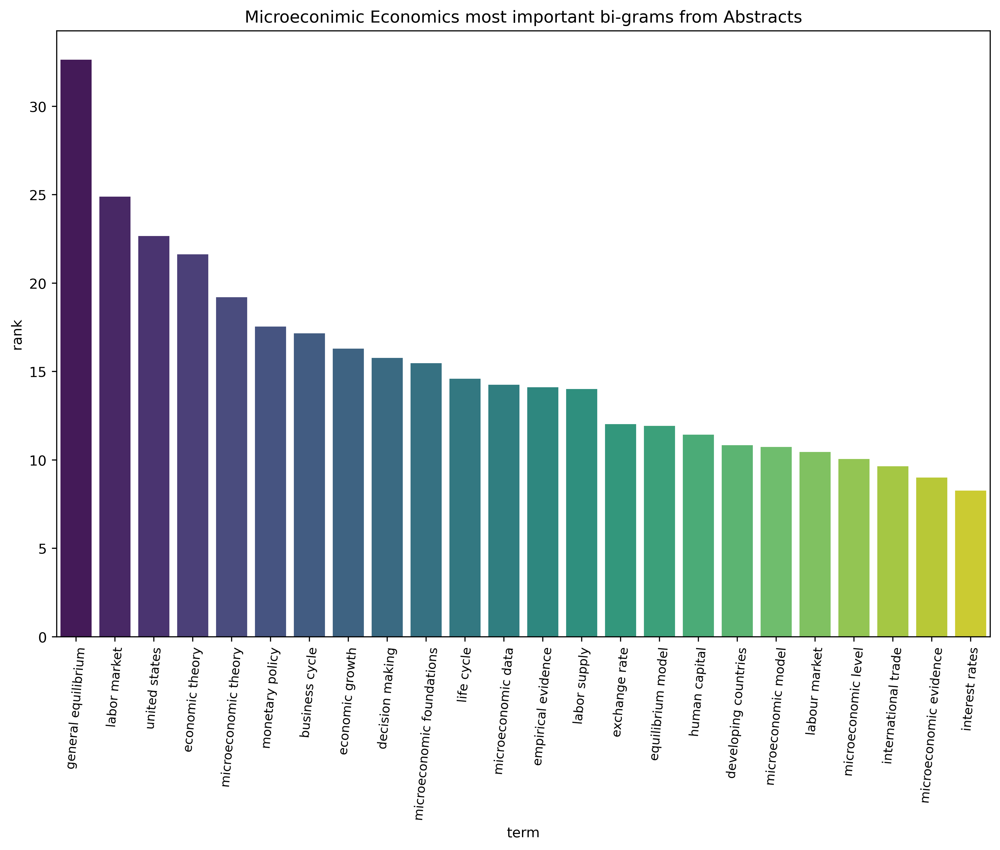

In [28]:
 # Getting top ranking features
sums = abstracts_tfidf.sum(axis = 0)
data1 = []
for col, term in enumerate(features_abstracts):
    data1.append((term, sums[0, col]))
ranking = pd.DataFrame(data1, columns = ['term', 'rank'])
words = (ranking.sort_values('rank', ascending = False))
print("\n\nMost relevant bi-grams \n", words.head(50))
plt.figure(figsize=(12,8), dpi=400)
sns.barplot(x="term", y="rank", data=ranking.loc[ranking['term'].isin(['business cycle',
       'decision making', 'developing countries', 'economic growth',
       'economic theory', 'empirical evidence', 'equilibrium model',
       'exchange rate', 'general equilibrium',
       'human capital', 'interest rates',
       'international trade', 'labor market', 'labor supply',
       'labour market','life cycle','microeconomic data', 'microeconomic evidence',
       'microeconomic foundations', 'microeconomic level',
       'microeconomic model', 'microeconomic theory', 'monetary policy',
       'united states'])].sort_values('rank', ascending = False), palette = 'viridis')
plt.title("Microeconimic Economics most important bi-grams from Abstracts")
plt.xticks(fontsize=9, rotation=85);
plt.yticks(fontsize=10);

In [29]:
ranking['term'].unique()

array(['abstract paper', 'business cycle', 'cross sectional', 'data set',
       'decision making', 'developing countries', 'economic growth',
       'economic theory', 'empirical evidence', 'equilibrium model',
       'et al', 'exchange rate', 'firm level', 'general equilibrium',
       'human capital', 'interest rate', 'interest rates',
       'international trade', 'labor market', 'labor supply',
       'labour market', 'level data', 'life cycle', 'long run',
       'long term', 'microeconomic data', 'microeconomic evidence',
       'microeconomic foundations', 'microeconomic level',
       'microeconomic model', 'microeconomic theory', 'monetary policy',
       'panel data', 'paper analyzes', 'paper develops', 'paper examines',
       'paper investigates', 'paper presents', 'paper shows',
       'paper studies', 'recent years', 'results suggest', 'short run',
       'time series', 'united states', 'using data'], dtype=object)

In [30]:
ranking.loc[ranking['term'].isin(['business cycle',
       'decision making', 'developing countries', 'economic growth',
       'economic theory', 'empirical evidence', 'equilibrium model',
       'exchange rate', 'general equilibrium',
       'human capital', 'interest rates',
       'international trade', 'labor market', 'labor supply',
       'labour market','life cycle','microeconomic data', 'microeconomic evidence',
       'microeconomic foundations', 'microeconomic level',
       'microeconomic model', 'microeconomic theory', 'monetary policy',
       'united states'])].sort_values('rank', ascending = False)

,term,rank
13,general equilibrium,32.638431
18,labor market,24.888963
44,united states,22.660751
7,economic theory,21.630414
30,microeconomic theory,19.195518
31,monetary policy,17.542803
1,business cycle,17.159014
6,economic growth,16.292155
4,decision making,15.768884
27,microeconomic foundations,15.475365


In [31]:
#tf_idf_abstracts = pd.DataFrame.sparse.from_spmatrix(abstracts_tfidf, columns=vectorizer_abstracts.get_feature_names())
tf_idf_abstracts = pd.DataFrame(data=abstracts_tfidf.toarray(),columns=vectorizer_abstracts.get_feature_names())
tf_idf_abstracts.shape

(828, 46)

In [32]:
tf_idf_abstracts.columns

Index(['abstract paper', 'business cycle', 'cross sectional', 'data set', 'decision making', 'developing countries', 'economic growth', 'economic theory', 'empirical evidence', 'equilibrium model', 'et al', 'exchange rate', 'firm level', 'general equilibrium', 'human capital', 'interest rate', 'interest rates', 'international trade', 'labor market', 'labor supply', 'labour market', 'level data', 'life cycle', 'long run', 'long term', 'microeconomic data', 'microeconomic evidence', 'microeconomic foundations', 'microeconomic level', 'microeconomic model', 'microeconomic theory', 'monetary policy', 'panel data', 'paper analyzes', 'paper develops', 'paper examines', 'paper investigates', 'paper presents', 'paper shows', 'paper studies', 'recent years', 'results suggest', 'short run', 'time series', 'united states', 'using data'], dtype='object')

In [33]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_X = scaler.fit_transform(tf_idf_abstracts)

In [34]:
from sklearn.decomposition import PCA

In [35]:
explained_variance = []

for n in range(1,tf_idf_abstracts.shape[1]+1):
    pca = PCA(n_components=n)
    pca.fit(scaled_X)
    explained_variance.append(np.sum(pca.explained_variance_ratio_))

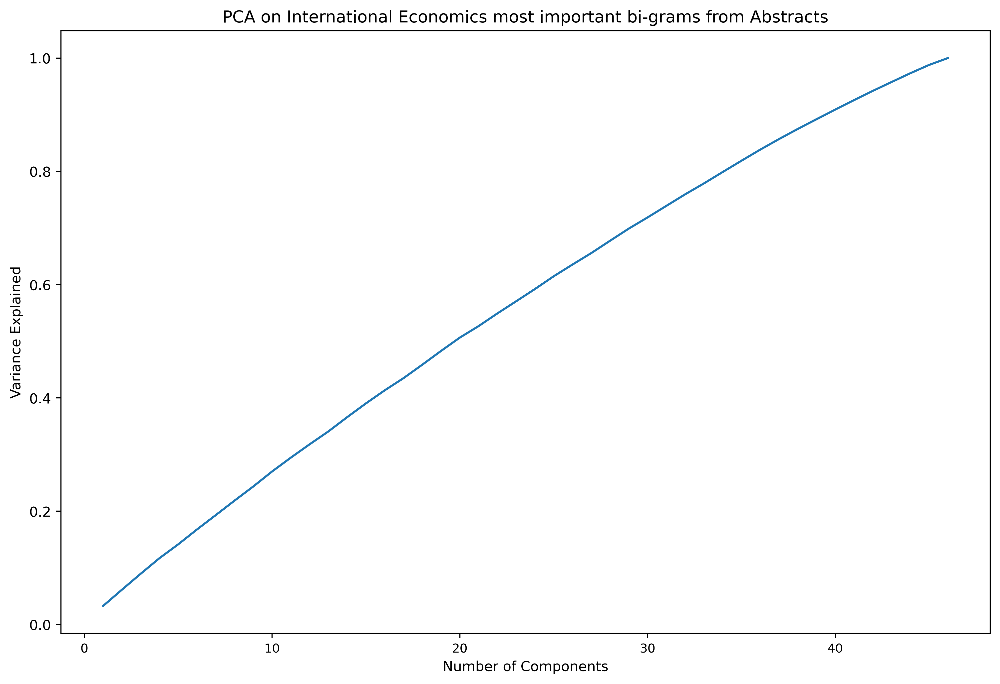

In [36]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(range(1,tf_idf_abstracts.shape[1]+1),explained_variance)
plt.title("PCA on International Economics most important bi-grams from Abstracts")
plt.xticks(fontsize=9);
plt.yticks(fontsize=10);
plt.xlabel("Number of Components")
plt.ylabel("Variance Explained");

In [37]:
interesting_columns = ['business cycle',
       'decision making', 'developing countries', 'economic growth',
       'economic theory', 'empirical evidence', 'equilibrium model',
       'exchange rate', 'general equilibrium',
       'human capital', 'interest rates',
       'international trade', 'labor market', 'labor supply',
       'labour market','life cycle','microeconomic data', 'microeconomic evidence',
       'microeconomic foundations', 'microeconomic level',
       'microeconomic model', 'microeconomic theory', 'monetary policy',
       'united states']

In [38]:
tf_idf_abstracts = tf_idf_abstracts[interesting_columns]
tf_idf_abstracts.shape

(828, 24)

{'1': Text(0.2149808579376174, -0.06341211460477579, '1'),
 '2': Text(0.6731091702843509, -0.9999999999999999, '2'),
 '3': Text(0.48966532349780506, 0.19983830397296573, '3'),
 '4': Text(-0.4214319586374069, 0.5335485712972589, '4'),
 '5': Text(0.4118679443244562, -0.10859633154287256, '5'),
 '6': Text(-0.218293973232347, 0.07943909425991026, '6'),
 '7': Text(0.014617889874797303, 0.08158275392915122, '7'),
 '8': Text(-0.11237956520417153, 0.6275455938849137, '8'),
 '9': Text(0.07863384358751778, 0.09017020705952533, '9'),
 '10': Text(0.14987850354215163, 0.5095102750306044, '10'),
 '11': Text(0.11125712979377754, 0.03548121515903601, '11'),
 '12': Text(-0.5200405151813938, 0.2622326814826776, '12'),
 '13': Text(-0.7741810872257283, -0.1330286955274646, '13'),
 '14': Text(0.09043749609868441, -0.36751442850440175, '14'),
 '15': Text(-0.8343369599668397, -0.5660763411063736, '15'),
 '16': Text(-0.09238576607790497, -0.5436327418930759, '16'),
 '17': Text(0.19569368513651333, -0.02241322

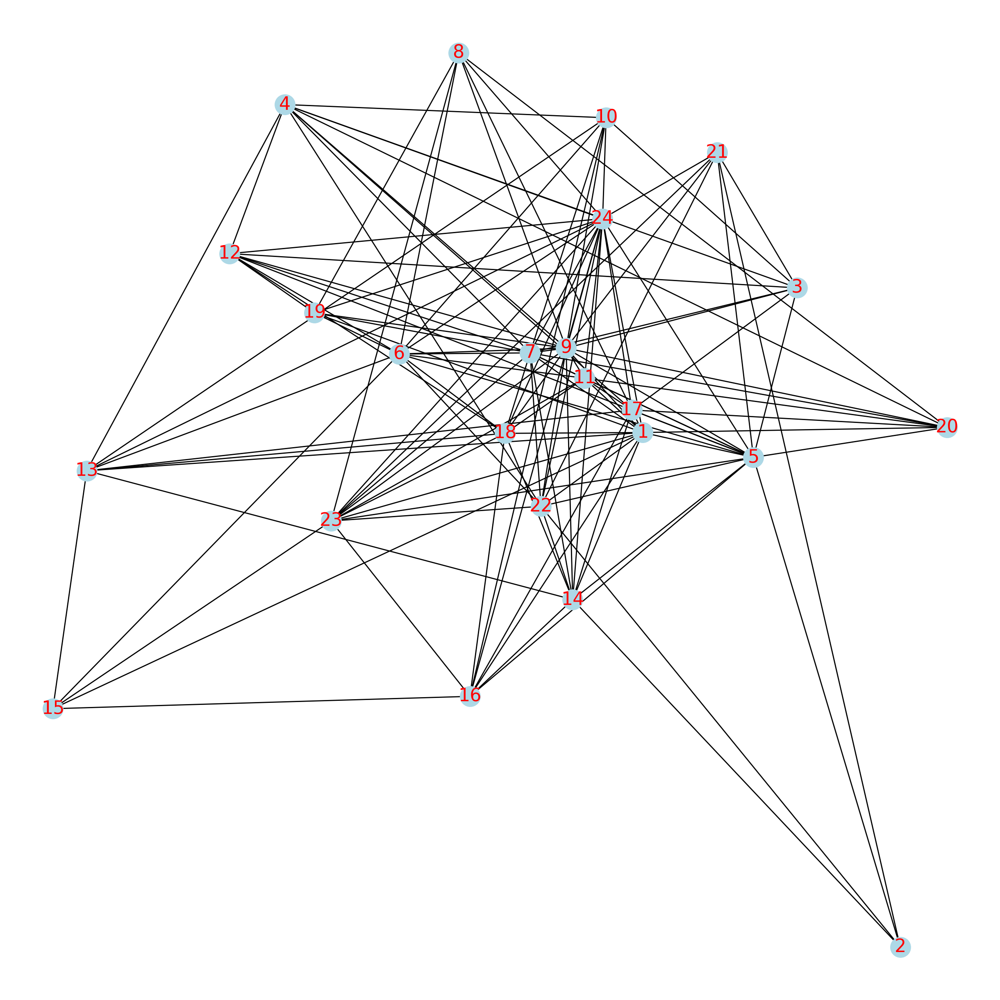

In [39]:
tf_idf_abstracts_2 = tf_idf_abstracts.rename({'business cycle':'1',
       'decision making':'2', 'developing countries':'3', 'economic growth':'4',
       'economic theory':'5', 'empirical evidence':'6', 'equilibrium model':'7',
       'exchange rate':'8', 'general equilibrium':'9',
       'human capital':'10', 'interest rates':'11',
       'international trade':'12', 'labor market':'13', 'labor supply':'14',
       'labour market':'15','life cycle':'16','microeconomic data':'17', 'microeconomic evidence':'18',
       'microeconomic foundations':'19', 'microeconomic level':'20',
       'microeconomic model':'21', 'microeconomic theory':'22', 'monetary policy':'23',
       'united states':'24'}, axis='columns')
meta_matrix = tf_idf_abstracts_2.transpose().dot(tf_idf_abstracts_2)
G=nx.from_pandas_adjacency(meta_matrix)
plt.figure(figsize=(12,12), dpi=200)
nx.draw(G, pos=nx.kamada_kawai_layout(G), node_color='lightblue')
#nx.draw_networkx_nodes(G, pos=nx.kamada_kawai_layout(G), node_color="tab:red")
nx.draw_networkx_labels(G, pos=nx.kamada_kawai_layout(G), font_size=16, font_color="red")

In [40]:
centrality_time_series = []
count = 0 

# andare di anno in anno
for i in range(0, len(place_holder)-1):
    if(place_holder[i+1]-place_holder[i] > 1):
        count += 1
        meta_matrix = tf_idf_abstracts.iloc[place_holder[i]:place_holder[i+1]+1,:].transpose().dot(tf_idf_abstracts.iloc[place_holder[i]:place_holder[i+1]+1,:])
        G=nx.from_pandas_adjacency(meta_matrix)
        centrality_time_series = centrality_time_series + list(nx.degree_centrality(G).values())
        #clustering_time_series = clustering_time_series + list(nx.clustering(G).values())

In [41]:
centrality_time_series = np.reshape(centrality_time_series,(count,tf_idf_abstracts.shape[1]))
df_centrality_time_series = pd.DataFrame(data=centrality_time_series, columns=interesting_columns)
df_centrality_time_series['year'] = ""
df_centrality_time_series['year'] = interesting_years
#df_centrality_time_series.to_csv('centrality_time_series_abstracts_bigrams_international.csv')

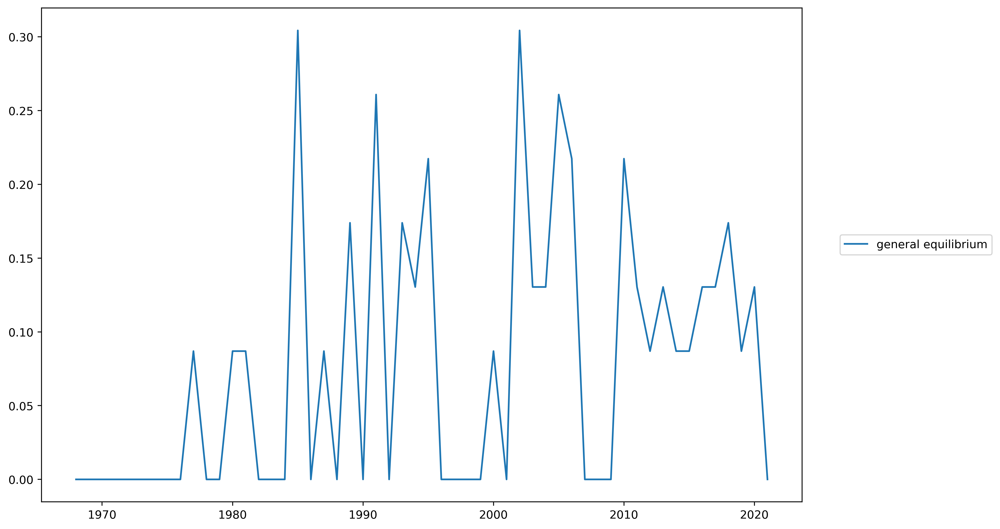

In [42]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['general equilibrium'], label = "general equilibrium")
plt.legend(loc=(1.05,0.5))

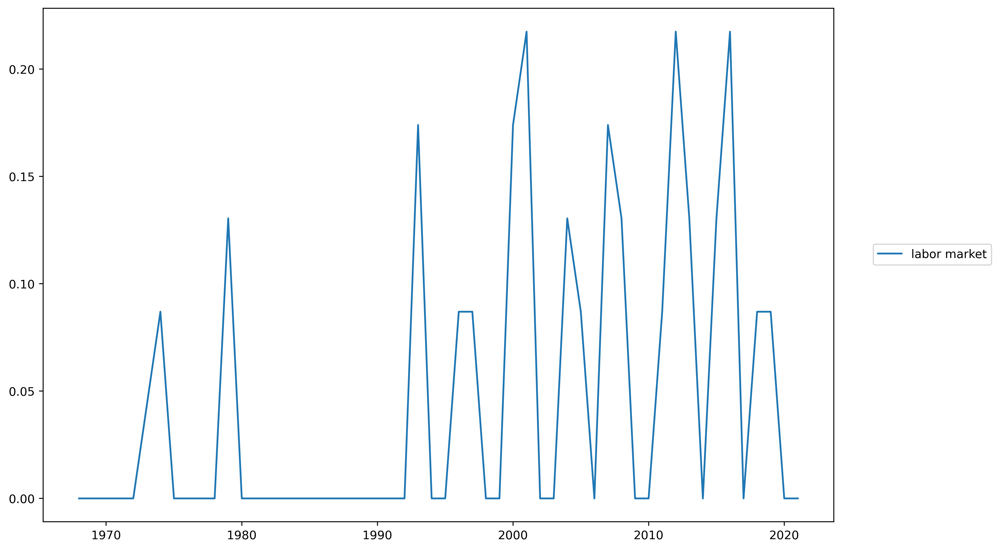

In [43]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['labor market'], label = "labor market")
plt.legend(loc=(1.05,0.5))

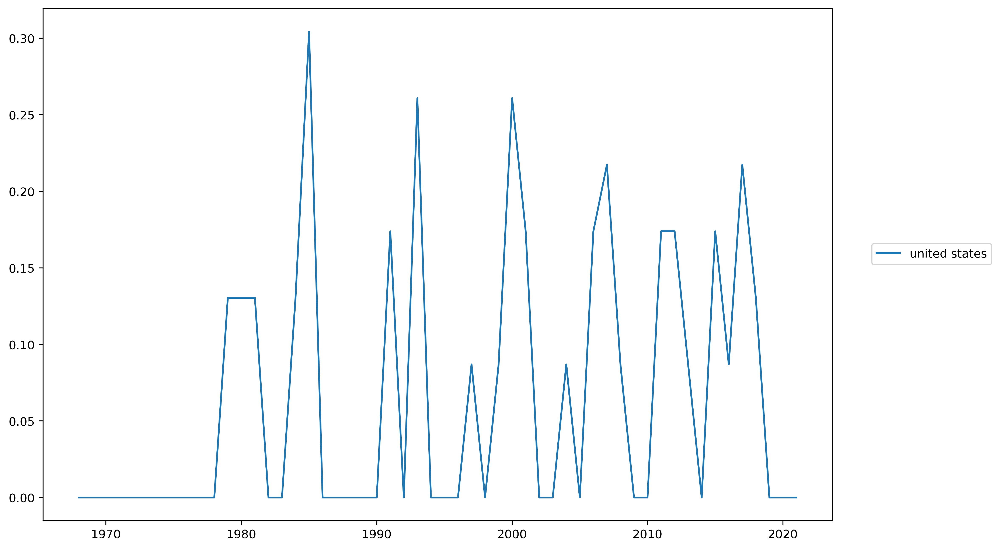

In [44]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['united states'], label = "united states")
plt.legend(loc=(1.05,0.5))

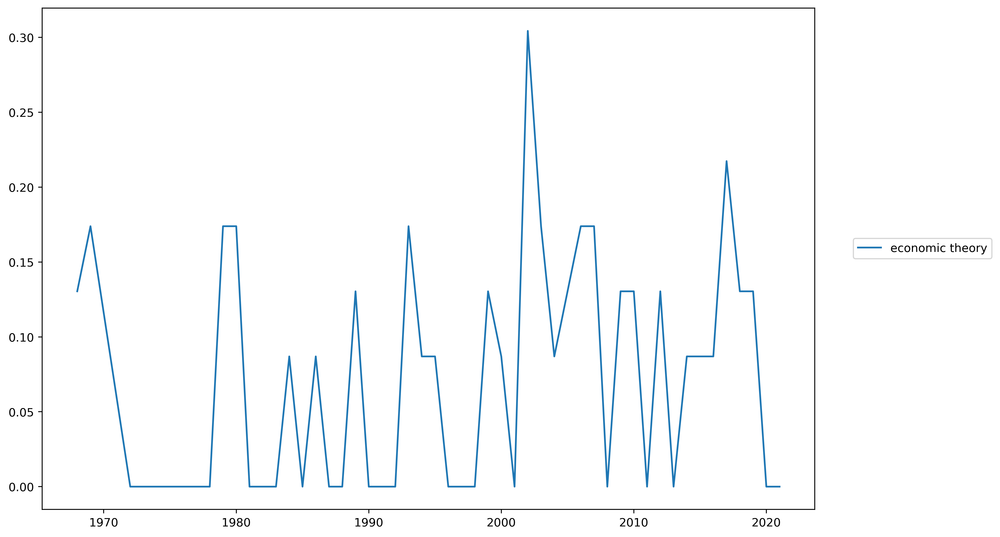

In [45]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['economic theory'], label = "economic theory")
plt.legend(loc=(1.05,0.5))

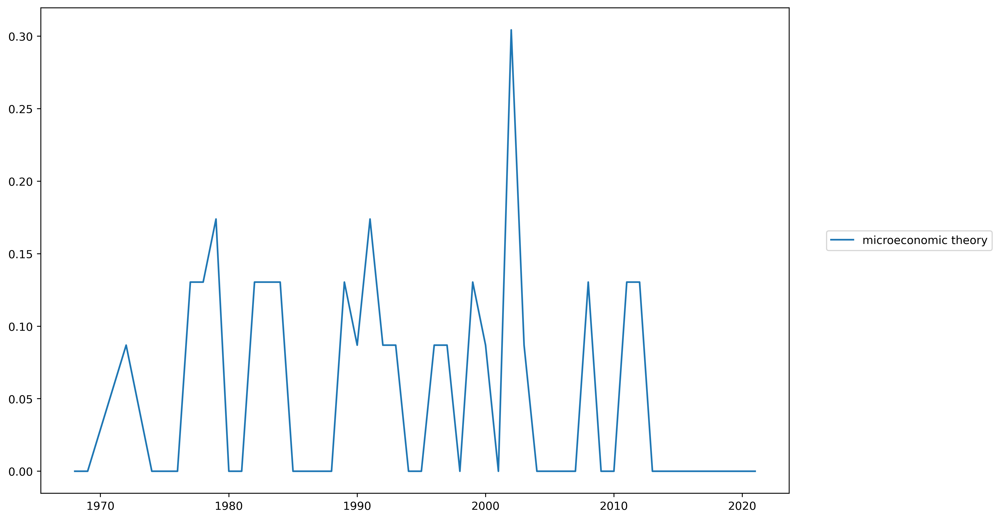

In [46]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['microeconomic theory'], label = "microeconomic theory")
plt.legend(loc=(1.05,0.5))

In [47]:
df.to_csv('microeconimic_cleaned.csv')

<ipython-input-48-a24d40afe3e2>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8), dpi=400)


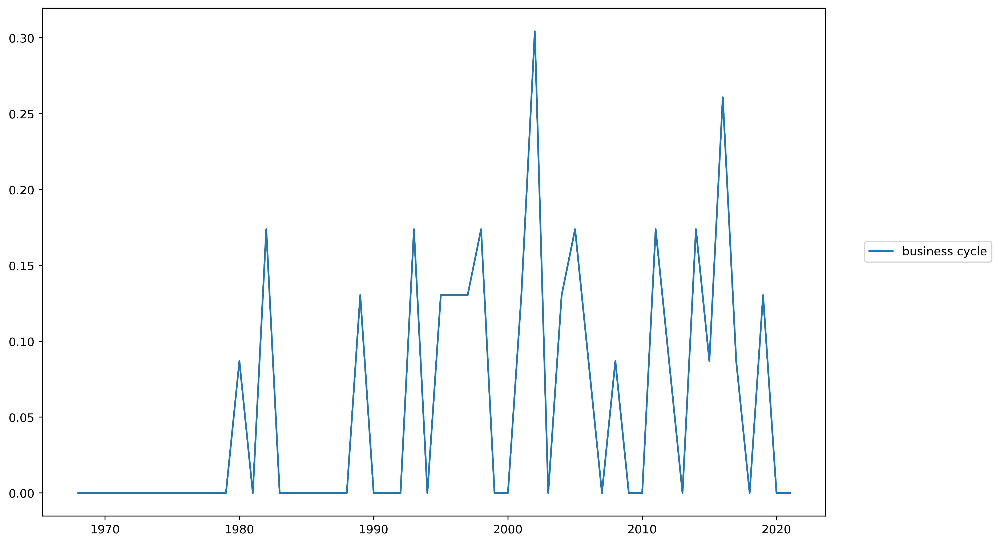

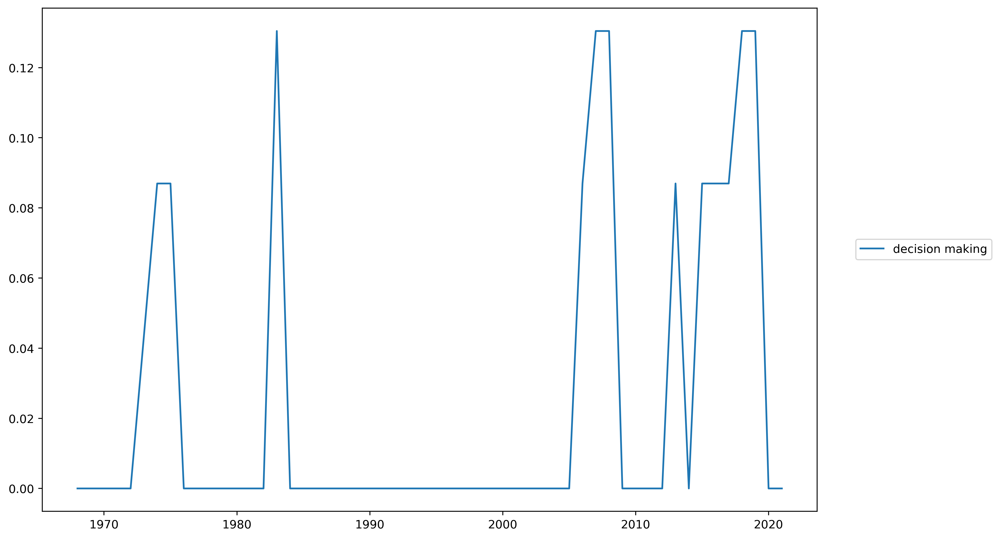

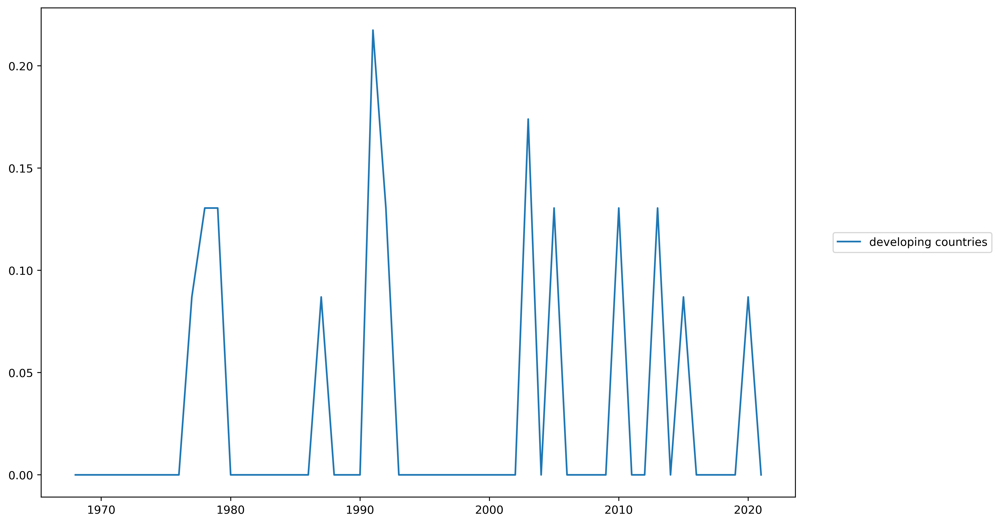

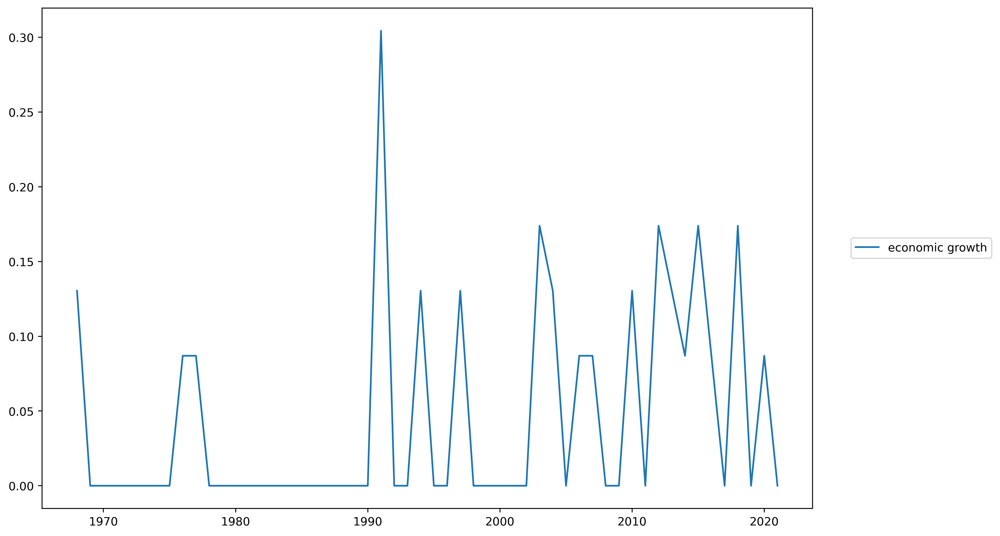

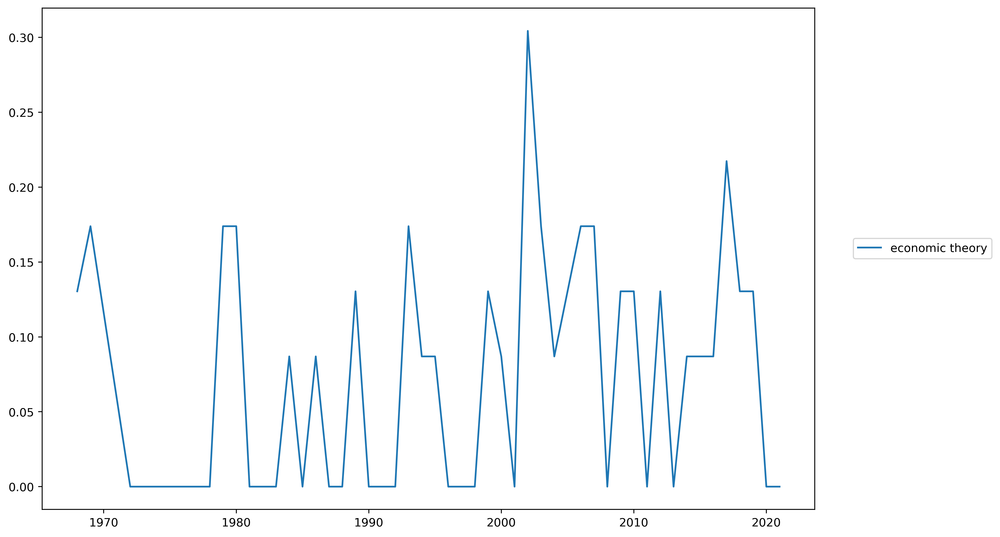

...

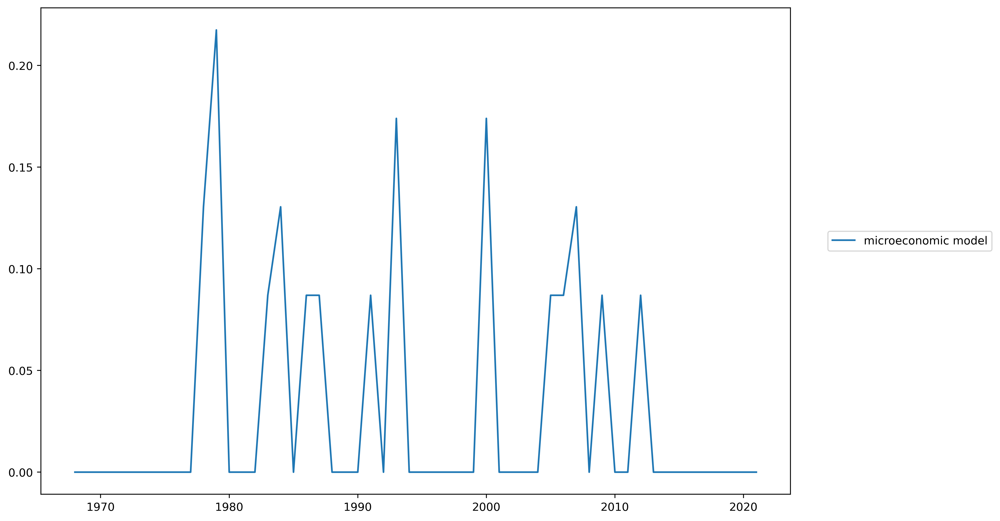

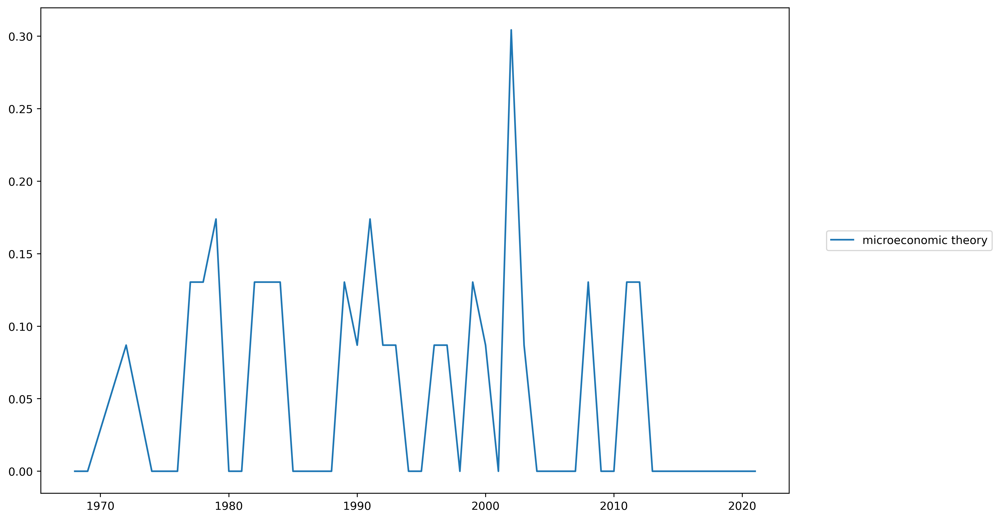

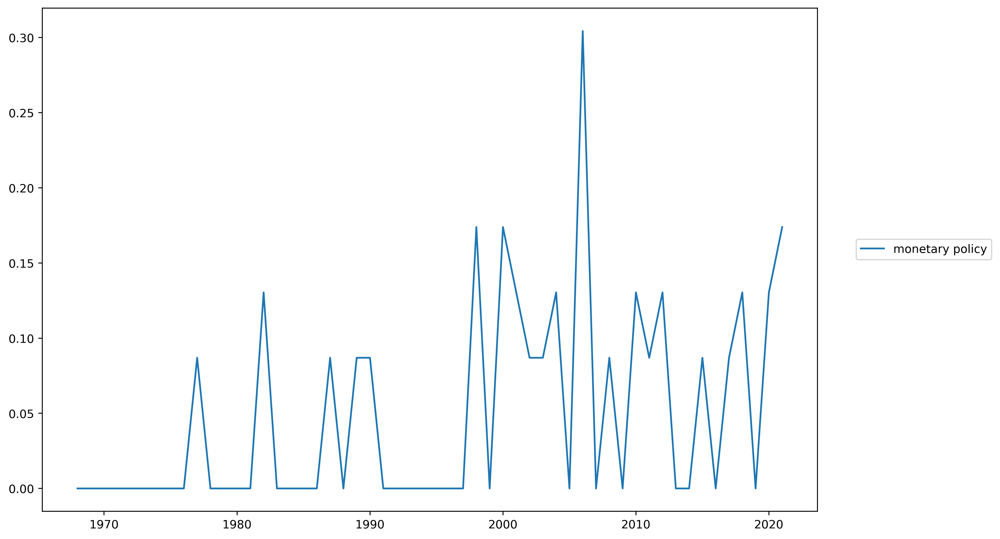

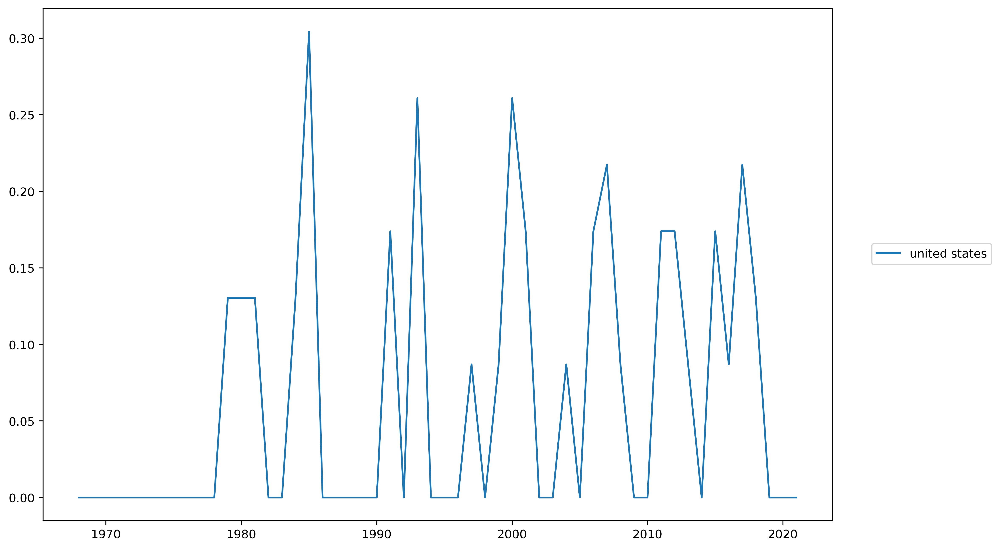

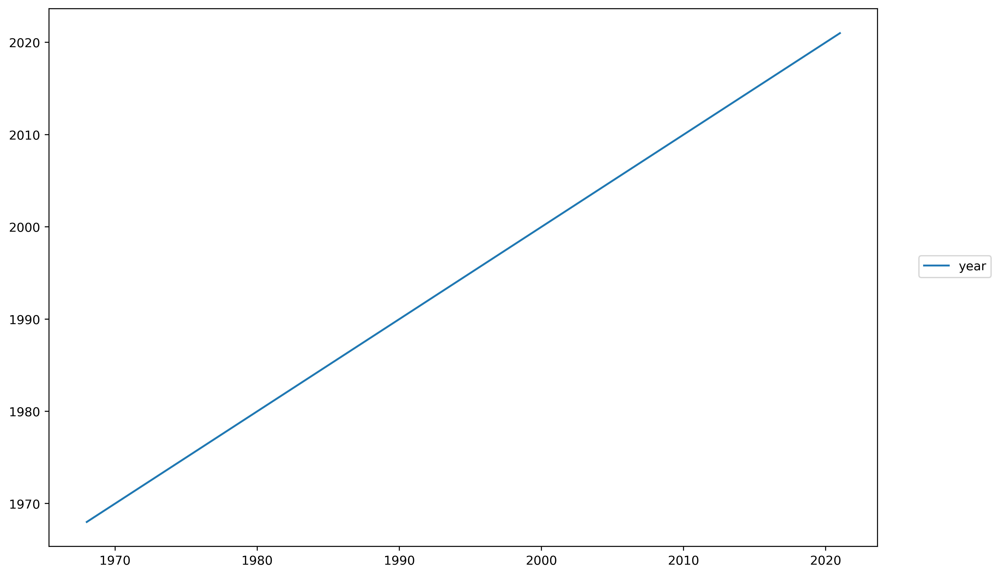

In [48]:
for feature in df_centrality_time_series:
    plt.figure(figsize=(12,8), dpi=400)
    plt.plot(df_centrality_time_series['year'],df_centrality_time_series[feature], label = feature)
    plt.legend(loc=(1.05,0.5))